# Basic EDA for the Final Report

## Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import requests
import json

# Required for formatting dates later in the case
import datetime
import matplotlib.dates as mdates

import folium  #needed for interactive map
from folium.plugins import HeatMap
from folium import GeoJson

import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go

## Basic EDA on the Raw Tables

In [2]:
listing = pd.read_csv('datasets/listings.csv')
listing_df = listing.drop(columns=['review_scores_value','weekly_price'])
listing_df["total_space_available"]=listing_df["accommodates"]*listing_df["availability_30"]

In [3]:
# basic summary statistics
listing_df.describe()

,accommodates,availability_30,bathrooms,bedrooms,beds,has_availability,host_id,id,latitude,longitude,price,review_scores_checkin,review_scores_cleanliness,review_scores_communication,review_scores_location,review_scores_rating,total_space_available
count,59763.000000,59824.000000,59622.000000,59729.000000,59715.000000,0.0,5.982400e+04,5.982400e+04,59824.000000,59824.000000,59824.000000,45478.000000,45544.000000,45539.000000,45475.000000,45624.000000,59763.000000
mean,3.031960,7.976448,1.183447,1.221969,1.626107,NaN,3.100695e+07,1.007171e+07,40.651362,-76.674881,159.009378,9.738555,9.289786,9.758624,9.463002,93.474750,25.113030
std,1.999427,10.062641,0.483726,0.775982,1.128178,NaN,3.216733e+07,5.507015e+06,0.862090,7.139989,236.200222,0.662886,1.066889,0.645440,0.818924,8.240908,41.605901
min,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,7.200000e+01,5.900000e+02,38.823403,-105.094563,0.000000,2.000000,2.000000,2.000000,2.000000,20.000000,0.000000
25%,2.000000,0.000000,1.000000,1.000000,1.000000,NaN,5.453285e+06,5.477726e+06,40.673848,-76.981725,70.000000,10.000000,9.000000,10.000000,9.000000,90.000000,0.000000
50%,2.000000,3.000000,1.000000,1.000000,1.000000,NaN,1.965590e+07,1.022793e+07,40.722133,-73.972984,109.000000,10.000000,10.000000,10.000000,10.000000,96.000000,8.000000
75%,4.000000,13.000000,1.000000,1.000000,2.000000,NaN,4.667932e+07,1.505785e+07,40.791820,-73.942720,176.000000,10.000000,10.000000,10.000000,10.000000,100.000000,34.000000
max,16.000000,30.000000,8.000000,10.000000,16.000000,NaN,1.297105e+08,1.867079e+07,42.389982,-71.000100,10000.000000,10.000000,10.000000,10.000000,10.000000,100.000000,480.000000


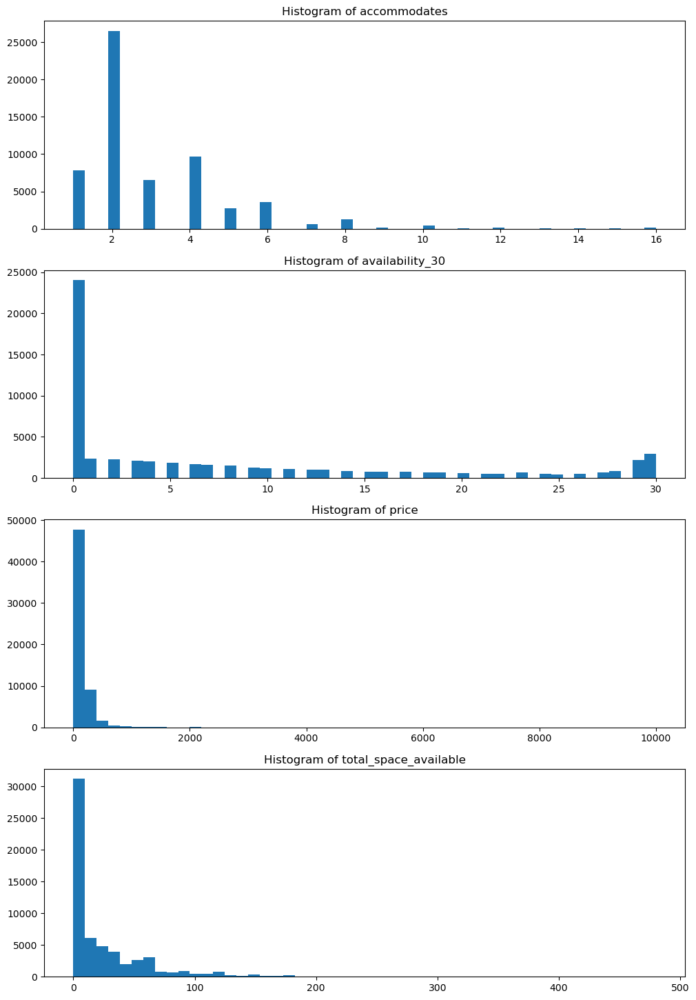

In [4]:
# histogram for every column
plt.figure(figsize=(12, 18))
plt.subplots_adjust(hspace=0.2)
vars_to_plot=['accommodates', 'availability_30', 'price', 'total_space_available']
for i, var in enumerate(vars_to_plot):
    plt.subplot(4, 1, i+1)
    plt.hist(listing_df[var], 50)
    title_string = "Histogram of " + var
    plt.title(title_string)


Most of listings accomodate for 2 people.

There is a substantial amount of listings with no availability in the next 30 days.

The price of listings are skewed to the right, the majority of listing prices are under $200 a night. 

The total space available for listings are skewed to the right, a lot of listings with under 10 spaces available for the next 30 days.

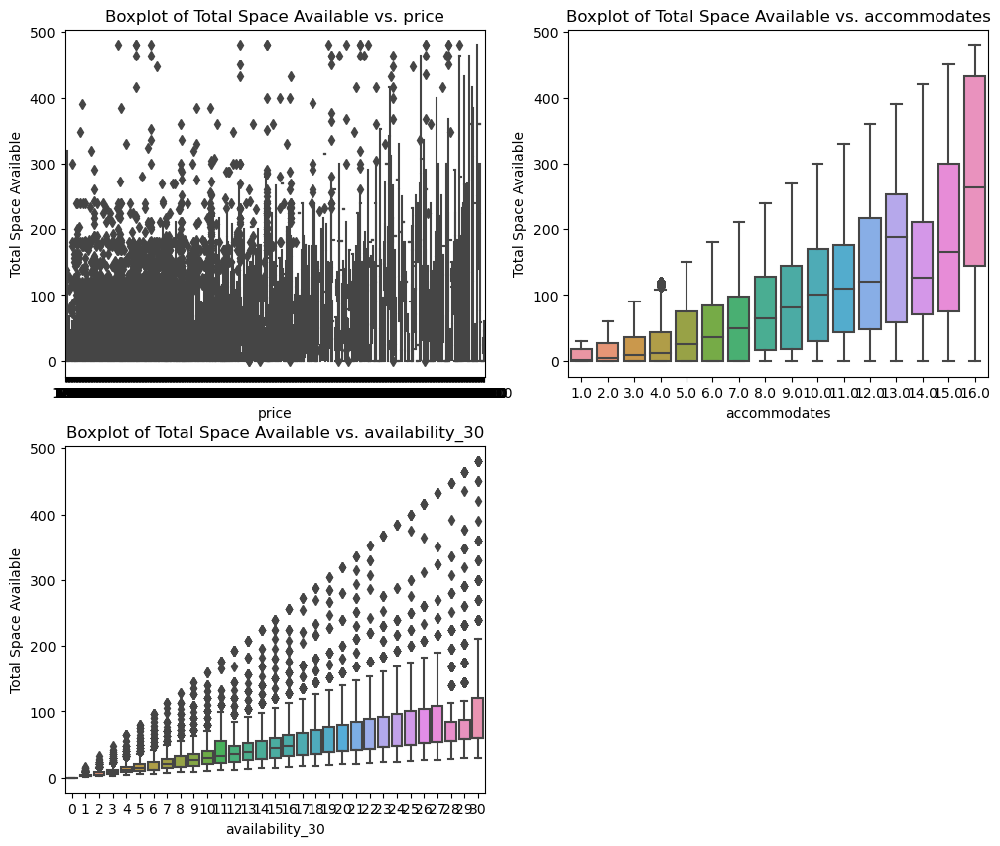

In [5]:
# plotting against total_space_available, our variable of interest
plt.figure(figsize=(12,10))
vars_to_plot = ['price', 'accommodates', 'availability_30']
for i, var in enumerate(vars_to_plot):
    plt.subplot(2,2,i+1)
    sns.boxplot(x = var, y='total_space_available', data = listing_df)
    title_string = "Boxplot of Total Space Available vs. " + var
    plt.ylabel("Total Space Available")
    plt.title(title_string)


Text(0.5, 1.0, 'Correlation Matrix Heatmap for Listing Data')

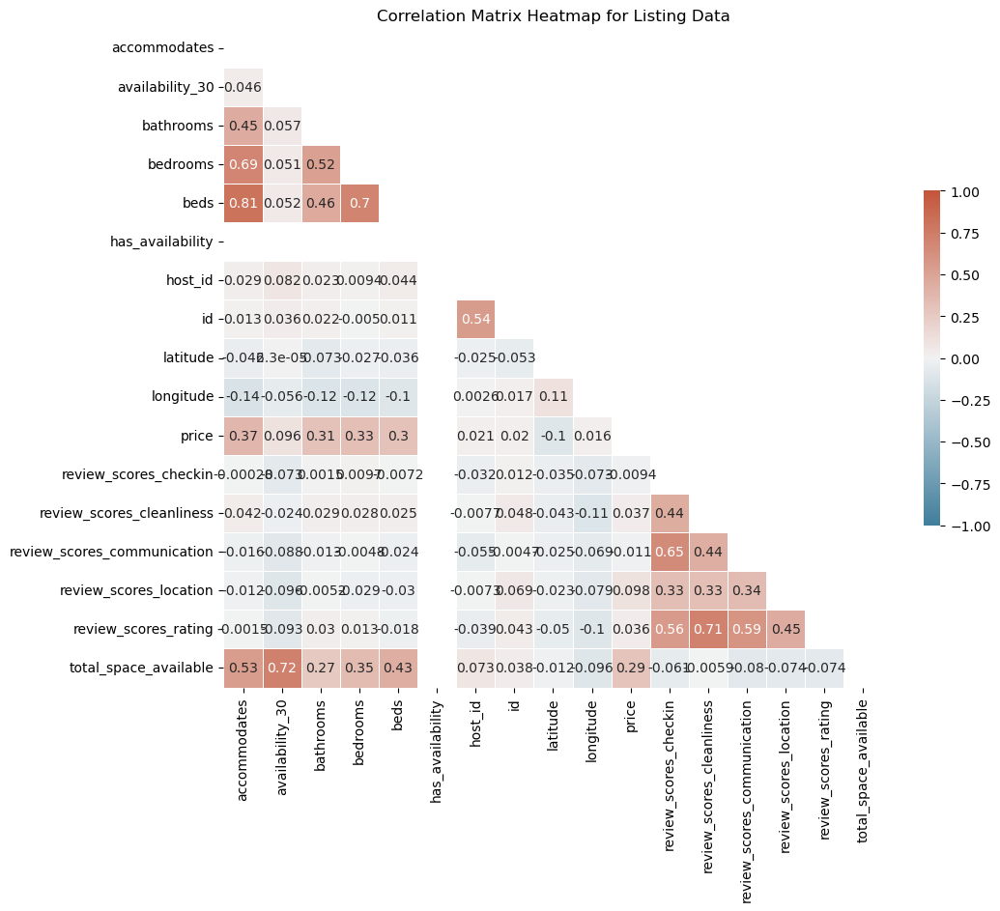

In [6]:
# correlation matrix
corr = listing_df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(11,9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
heatmap = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, vmin=-1,
            annot=True, center=0, square=True, linewidths=.5, 
            cbar_kws={"shrink":.5})
heatmap.set_title('Correlation Matrix Heatmap for Listing Data')


In [7]:
listing_df.isnull().sum()

accommodates                      61
amenities                          0
availability_30                    0
bathrooms                        202
bed_type                           0
bedrooms                          95
beds                             109
cancellation_policy                0
city                              46
has_availability               59824
host_id                            0
id                                 0
instant_bookable                   0
latitude                           0
longitude                          0
metropolitan                       0
name                              41
price                              0
property_type                      4
review_scores_checkin          14346
review_scores_cleanliness      14280
review_scores_communication    14285
review_scores_location         14349
review_scores_rating           14200
room_type                          0
state                              0
zipcode                          826
t

In [8]:
hm_listing = listing_df[['latitude', 'longitude', 'total_space_available']]
# hm_listing.isnull().sum()
hm_listing.dropna(inplace=True)


/var/folders/ld/wk4slw9d291fzrzw605_9lnc0000gn/T/ipykernel_91924/2820412919.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hm_listing.dropna(inplace=True)


In [9]:
# maps! looking at location
max_amount = float(hm_listing['total_space_available'].max())

folium_hmap = folium.Map(location=[40.738, -73.98],
                        zoom_start=10,
                        tiles="OpenStreetMap")
hm_wide = HeatMap(list(zip(hm_listing['latitude'], hm_listing['longitude'], hm_listing['total_space_available'])),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=8, blur=6, 
                   max_zoom=15, 
                 )

folium_hmap.add_child(hm_wide)

/var/folders/ld/wk4slw9d291fzrzw605_9lnc0000gn/T/ipykernel_91924/341151262.py:7: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  hm_wide = HeatMap(list(zip(hm_listing['latitude'], hm_listing['longitude'], hm_listing['total_space_available'])),


In [10]:
# different neightbourhoods in New York
new_york_neighbourhoods = json.load(open("datasets/newyork-neighbourhoods.geojson", 'r'))
new_york_boroughs = json.load(open("datasets/Borough Boundaries.geojson", 'r'))

In [11]:
neighbour_id_map = {}
for feature in new_york_neighbourhoods['features']:
    feature['id'] = feature['properties']['neighbourhood_group']
    neighbour_id_map[feature['properties']['neighbourhood'].lower()] = feature['id'].lower()


In [12]:
listing_ny_df = listing_df[listing_df['state'] == 'NY']
# clean listings
listing_ny_df = listing_ny_df[listing_ny_df['city'].notna()]
listing_ny_df = listing_ny_df[listing_ny_df['zipcode'].notna()]
listing_ny_df["zipcode"] = listing_ny_df["zipcode"].str[:5]
listing_ny_df["zipcode"] = listing_ny_df["zipcode"].replace(
    [" ", "1m"], 
    ["20017", "10025"])
listing_ny_df["zipcode"] = listing_ny_df["zipcode"].apply(lambda x: int(float(x)))
listing_ny_df.head()

,accommodates,amenities,availability_30,bathrooms,bed_type,bedrooms,beds,cancellation_policy,city,has_availability,...,property_type,review_scores_checkin,review_scores_cleanliness,review_scores_communication,review_scores_location,review_scores_rating,room_type,state,zipcode,total_space_available
0,2.0,"{""Cable TV"",""Wireless Internet"",""Air condition...",24,1.0,Real Bed,1.0,1.0,moderate,sunnysidebronx,NaN,...,House,10.0,10.0,10.0,10.0,100.0,Private room,NY,10464,48.0
1,4.0,"{TV,Internet,""Wireless Internet"",""Air conditio...",30,1.0,Real Bed,1.0,1.0,flexible,sunnysidebronx,NaN,...,Apartment,NaN,NaN,NaN,NaN,NaN,Private room,NY,10464,120.0
2,4.0,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",30,3.0,Real Bed,3.0,3.0,strict,sunnysidebronx,NaN,...,House,NaN,NaN,NaN,NaN,NaN,Entire home/apt,NY,10464,120.0
3,3.0,"{TV,Internet,""Wireless Internet"",""Air conditio...",8,1.0,Real Bed,1.0,1.0,strict,long island city,NaN,...,Apartment,10.0,10.0,10.0,10.0,93.0,Entire home/apt,NY,10464,24.0
4,4.0,"{Internet,""Wireless Internet"",""Air conditionin...",17,1.0,Real Bed,1.0,1.0,moderate,sunnysidebronx,NaN,...,House,10.0,10.0,10.0,10.0,97.0,Private room,NY,10464,68.0


In [13]:
def zipcode_to_borough(row):
    if 10001 <= row['zipcode'] <= 10282:
        return 'Manhattan'
    elif 10301 <= row['zipcode'] <= 10314:
        return 'Staten Island'
    elif 10451 <= row['zipcode'] <= 10475:
        return 'Bronx'
    elif (11004 <= row['zipcode'] <= 11109) or (11351 <= row['zipcode'] <= 11697):
        return 'Queens'
    elif 11201 <= row['zipcode'] <= 11256:
        return 'Brooklyn'
    else:
        return np.nan

# listing_ny_df['borough'] = listing_ny_df.apply(zipcode_to_borough, axis=1)
listing_ny_df['borough'] = listing_ny_df.apply(lambda row: zipcode_to_borough(row), axis=1)

In [14]:
# aggregate data
listing_ny_aggr_data = listing_ny_df.pivot_table(index=['borough'], 
                                                 values=['total_space_available', 'price'], 
                                                 aggfunc = {
                                                       'total_space_available': np.sum,
                                                       'price': np.mean})
listing_ny_aggr_data.reset_index(inplace = True)
listing_ny_aggr_data.head()

,borough,price,total_space_available
0,Bronx,82.775039,23314.0
1,Brooklyn,119.675481,336420.0
2,Manhattan,180.118182,347563.0
3,Queens,95.052829,112279.0
4,Staten Island,129.241245,11702.0


In [15]:
# choropleth using folium maps
ny_map=folium.Map(location=[40.738, -73.98],
                        zoom_start=10,
                        tiles=None)
folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(ny_map)

folium.Choropleth(
    geo_data=new_york_boroughs,
    data=listing_ny_aggr_data,
    columns=['borough', 'total_space_available'],   
    legend_name='total space available',
    key_on='feature.properties.boro_name'
    ).add_to(ny_map)
ny_map

In [16]:
# real estate dataset
original_estate_df = pd.read_csv("datasets/real_estate.csv.gz", compression='gzip')
estate_df = original_estate_df[['type', 'zipcode', 'city', 'state', 'metro', 'county', 'size_rank', '2015-01', '2015-02', '2015-03', '2015-04', '2015-05', '2015-06', '2015-07', '2015-08', '2015-09', '2015-10', '2015-11', '2015-12']]
monthly_state_estate = estate_df.groupby(["state", "type"])[['2015-01', '2015-02', '2015-03', '2015-04', '2015-05', '2015-06', '2015-07', '2015-08', '2015-09', '2015-10', '2015-11', '2015-12']].mean().reset_index()


In [17]:
# pivot 
# monthly_pivot_estate = pd.pivot_table(monthly_state_estate, index=['state'])
monthly_melt_estate = monthly_state_estate.melt(id_vars=['state','type'])
monthly_melt_estate.rename(columns={'variable':'date'}, inplace=True)

monthly_melt_estate['datetime'] = monthly_melt_estate['date'].apply(
    lambda x: datetime.datetime.strptime(str(x), "%Y-%m")
)

In [18]:
temp_df = monthly_melt_estate[monthly_melt_estate['type'] == 'ZHVI']
estate_2015 = temp_df.pivot_table(index=['state'], values='value', aggfunc=np.mean)
estate_2015.reset_index(inplace=True)


fig = go.Figure(data=go.Choropleth(
    locations=estate_2015['state'], 
    z = estate_2015['value'].astype(float), 
    locationmode = 'USA-states', 
#     colorscale = 'blues',
    colorbar_title = "Index (Dollars USD)",
))

fig.update_layout(
    title_text = 'Average Zillow Home Value Index (ZHVI) in 2015"',
    geo_scope='usa', 
)

fig.show()


In [19]:
temp_df = monthly_melt_estate[monthly_melt_estate['type'] == 'ZRI']
estate_2015 = temp_df.pivot_table(index=['state'], values='value', aggfunc=np.mean)
estate_2015.reset_index(inplace=True)


fig = go.Figure(data=go.Choropleth(
    locations=estate_2015['state'], 
    z = estate_2015['value'].astype(float), 
    locationmode = 'USA-states', 
#     colorscale = 'blues',
    colorbar_title = "Index (Dollars USD)",
))

fig.update_layout(
    title_text = 'Average Zillow Observed Rent Index (ZRI) in 2015',
    geo_scope='usa', 
)

fig.show()


In [20]:
zipcode_df = pd.read_csv('datasets/uszips.csv')
zipcode_to_city = zipcode_df[['zip', 'city', 'lat', 'lng', 'state_id']]
zipcode_to_city = zipcode_to_city.rename(columns={'state_id': 'state', 
                                                  'zip': 'zipcode',
                                                  'lat': 'latitude',
                                                  'lng': 'longitude'})
zipcode_to_city.head(3)

demographics = pd.read_csv("datasets/demographics.csv")

# convert these values to NaNs
remove_set = {"-", "#VALUE", "#VALUE!", "(X)", "2,500-", "N"}

#TODO: what value should we put for 250,000+ (appears in median household income)
def string_to_float(x):
    if (x == "250,000+"):
        return float("250000")
    return float(x) if x not in remove_set else None

columns = ["$10,000-$14,999", "$15,000-$24,999", "$25,000-$34,999",
           "$35,000-$49,999", "$50,000-$64,999", "$65,000-$74,999",
           "$75,000-$99,999", "$100,000_or_more", "median_household_income",
           "mean_household_income"]

for column in columns:
    demographics[column] = demographics[column].apply(string_to_float)

# drop the rows with NaN in columns
for column in columns:
    demographics = demographics.drop(demographics[demographics[column].isnull()].index)

# merge demographics and clean_zipcode_df on the zipcode column
clean_demographics = pd.merge(demographics, zipcode_to_city, on="zipcode", how="inner")

# sum across all age groups to find total population
clean_demographics["total_population"] = clean_demographics.iloc[:, 2:14].sum(axis=1)
clean_demographics

# take selected columns only:
clean_demographics = clean_demographics[['zipcode', 'latitude', 'longitude', 'city', 'state', 'total_population','mean_household_income','median_household_income']]

# clean_demographics.reset_index(inplace = True)
clean_demographics.head(3)


,zipcode,latitude,longitude,city,state,total_population,mean_household_income,median_household_income
0,601,18.18027,-66.75266,Adjuntas,PR,17669,20349.0,10816.0
1,602,18.36075,-67.17541,Aguada,PR,39637,23282.0,16079.0
2,603,18.45744,-67.12225,Aguadilla,PR,51661,26820.0,16804.0


In [21]:
# heatmap using folium maps
ny_map = folium.Map(location=[40.738, -73.98],
                        zoom_start=10,
                        tiles="OpenStreetMap")
hm_wide = HeatMap(list(zip(clean_demographics['latitude'], clean_demographics['longitude'], clean_demographics['mean_household_income'])),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=8, blur=6, 
                   max_zoom=15, 
                 )

ny_map.add_child(hm_wide)

/var/folders/ld/wk4slw9d291fzrzw605_9lnc0000gn/T/ipykernel_91924/109413391.py:5: UserWarning:

The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.



In [22]:
# heatmap using folium maps
ny_map = folium.Map(location=[40.738, -73.98],
                        zoom_start=10,
                        tiles="OpenStreetMap")
hm_wide = HeatMap(list(zip(clean_demographics['latitude'], clean_demographics['longitude'], clean_demographics['total_population'])),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=8, blur=6, 
                   max_zoom=15, 
                 )

ny_map.add_child(hm_wide)

/var/folders/ld/wk4slw9d291fzrzw605_9lnc0000gn/T/ipykernel_91924/762892100.py:5: UserWarning:

The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.



In [23]:
# heatmap using folium maps
ny_map = folium.Map(location=[40.738, -73.98],
                        zoom_start=10,
                        tiles="OpenStreetMap")
hm_wide = HeatMap(list(zip(clean_demographics['latitude'], clean_demographics['longitude'], clean_demographics['median_household_income'])),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=8, blur=6, 
                   max_zoom=15, 
                 )

ny_map.add_child(hm_wide)

/var/folders/ld/wk4slw9d291fzrzw605_9lnc0000gn/T/ipykernel_91924/1537734356.py:5: UserWarning:

The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.



---
## Basic EDA on the Final Merged Table


In [24]:
df = pd.read_csv('datasets/final-data-test-4.csv')
# df['CapitalCity'] = df['city'].apply(lambda x: x.title())
df.head()

,city,state,total_space_available,listing_count,annual_GDP,personal_income_average,ur_average,ZHVI,ZRI,mean_household_income,median_household_income,total_population
0,new york,NY,346785.0,18903,5734124,1.161414e+09,6.490909,1.272732e+06,3897.236111,149315.866667,94798.577778,1586411
1,brooklyn,NY,336442.0,16527,5734124,1.161414e+09,6.490909,6.589633e+05,2334.423423,72558.297297,51469.189189,2550822
2,washington,DC,257492.0,7628,488582,4.927592e+07,4.845455,5.387349e+05,2672.238095,109793.695652,79608.260870,629974
3,chicago,IL,209510.0,5130,3107526,6.467891e+08,4.181818,2.063277e+05,1672.258929,81886.410714,57735.964286,2663653
4,denver,CO,73543.0,2421,1254994,2.777318e+08,3.827273,3.094294e+05,1903.177632,77030.421053,57185.157895,1012535


In [25]:
df.shape

(84, 12)

In [26]:
# basic summary statistics
df.describe()

,total_space_available,listing_count,annual_GDP,personal_income_average,ur_average,ZHVI,ZRI,mean_household_income,median_household_income,total_population
count,84.000000,84.000000,8.400000e+01,8.400000e+01,84.000000,8.400000e+01,84.000000,84.000000,84.000000,8.400000e+01
mean,17426.964286,694.535714,3.807550e+06,7.857113e+08,5.437121,4.445052e+05,2263.779971,89193.923915,68164.735579,1.844537e+05
std,62922.206171,2873.986591,1.944906e+06,3.800701e+08,1.066550,1.873982e+05,446.833226,31783.769594,21421.463583,4.607235e+05
min,6.000000,1.000000,4.885820e+05,4.927592e+07,3.827273,6.383333e+04,1224.916667,43358.000000,28885.000000,9.064000e+03
25%,222.750000,4.000000,1.939772e+06,4.253525e+08,4.381818,3.419229e+05,2016.625000,69230.750000,54423.400000,2.857300e+04
50%,883.000000,24.500000,3.107526e+06,6.467891e+08,5.072727,4.004757e+05,2244.732143,81279.205357,64361.250000,4.456000e+04
75%,3577.000000,118.000000,5.734124e+06,1.161414e+09,6.490909,5.349556e+05,2416.625000,101700.535714,79986.663462,9.264000e+04
max,346785.000000,18903.000000,5.734124e+06,1.161414e+09,6.490909,1.272732e+06,3897.236111,224293.000000,152760.666667,2.663653e+06


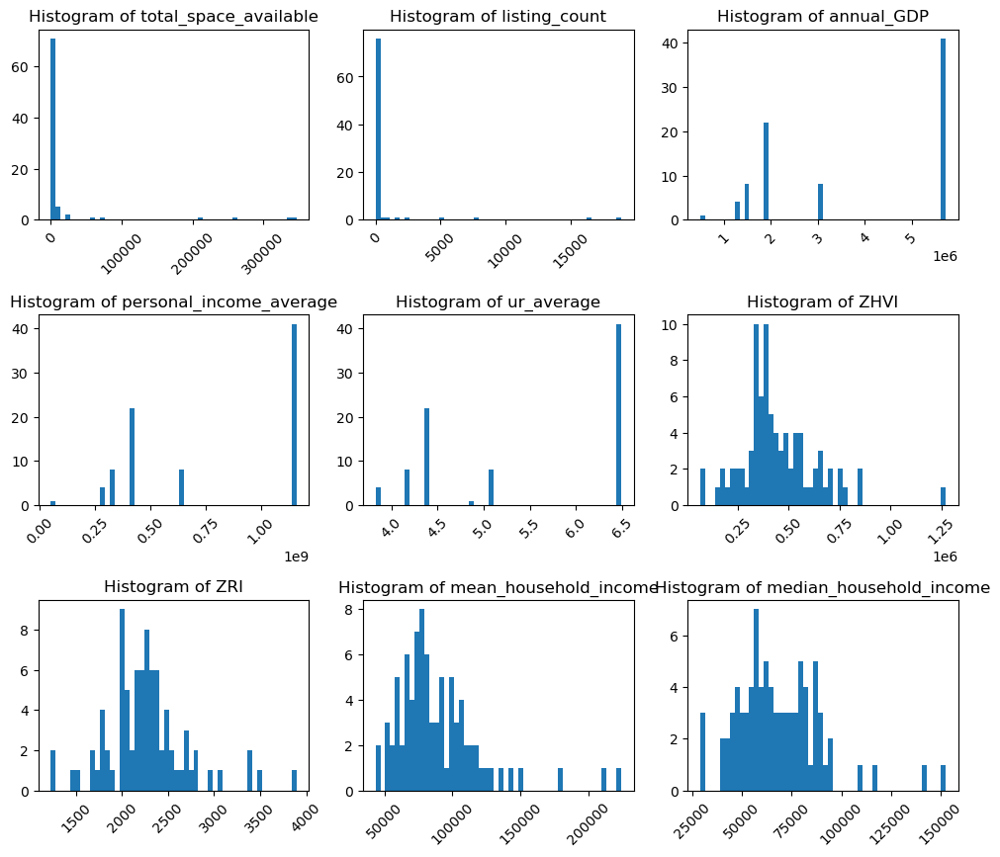

In [27]:
# histogram for every column
plt.figure(figsize=(12,10))
plt.subplots_adjust(hspace=0.5)
vars_to_plot=['total_space_available', 'listing_count', 'annual_GDP', 'personal_income_average', 'ur_average', 'ZHVI', 'ZRI', 'mean_household_income', 'median_household_income']
for i, var in enumerate(vars_to_plot):
    plt.subplot(3, 3, i+1)
    plt.hist(df[var], 50)
    title_string = "Histogram of " + var
    plt.title(title_string)
    plt.xticks(rotation=45)


The histogram of annual GDP matches with personal income average.
The histogram for total space available and listing count are skewed to the right. We have outliers cities with a lot of listings and total space available.

Text(0.5, 1.0, 'Correlation Matrix Heatmap for Rental, Real Estate, and Economic Data')

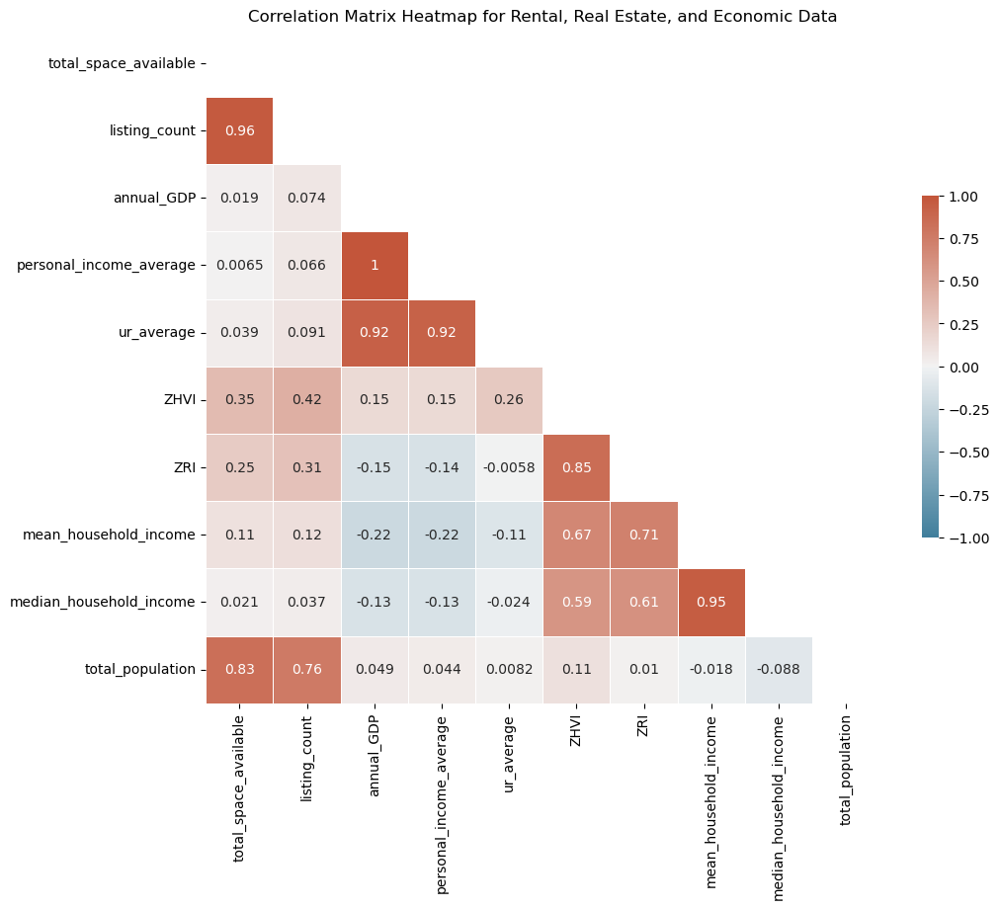

In [28]:
# correlation matrix
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(11,9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
heatmap = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, vmin=-1,
            annot=True, center=0, square=True, linewidths=.5, 
            cbar_kws={"shrink":.5})
heatmap.set_title('Correlation Matrix Heatmap for Rental, Real Estate, and Economic Data')

In [36]:
# get columns we are interested in
# total space available has a positive correlation with the state's GDP, city's total population and ZHVI
df2 = df[['city', 'state', 'total_space_available', 'listing_count', 'annual_GDP', 'ZHVI', 'median_household_income', 'total_population']]
df2.head(3)

,city,state,total_space_available,listing_count,annual_GDP,ZHVI,median_household_income,total_population
0,new york,NY,346785.0,18903,5734124,1.272732e+06,94798.577778,1586411
1,brooklyn,NY,336442.0,16527,5734124,6.589633e+05,51469.189189,2550822
2,washington,DC,257492.0,7628,488582,5.387349e+05,79608.260870,629974


### Explore similar cities in New York

In [40]:
# explore cities in new york
df2_ny = df2[df2['state']=='NY']
df2_ny.describe()

,total_space_available,listing_count,annual_GDP,ZHVI,median_household_income,total_population
count,41.000000,41.000000,41.0,4.100000e+01,41.000000,4.100000e+01
mean,19938.439024,964.731707,5734124.0,4.876393e+05,66398.521471,2.029573e+05
std,73957.170001,3854.812752,0.0,1.728188e+05,15162.046341,4.945224e+05
min,50.000000,1.000000,5734124.0,2.804000e+05,39554.880000,1.305200e+04
25%,445.000000,9.000000,5734124.0,3.838150e+05,55331.000000,3.103200e+04
50%,1425.000000,31.000000,5734124.0,4.280417e+05,62179.000000,4.777100e+04
75%,3764.000000,127.000000,5734124.0,5.528250e+05,79292.500000,9.741000e+04
max,346785.000000,18903.000000,5734124.0,1.272732e+06,95661.500000,2.550822e+06


In [43]:
df2_ny[(df2_ny["ZHVI"] > 552825) & (df2_ny["total_population"] > 47000)]

,city,state,total_space_available,listing_count,annual_GDP,ZHVI,median_household_income,total_population
0,new york,NY,346785.0,18903,5734124,1.272732e+06,94798.577778,1586411
1,brooklyn,NY,336442.0,16527,5734124,6.589633e+05,51469.189189,2550822
6,astoria,NY,23393.0,1101,5734124,6.099625e+05,56530.250000,148171
32,bayside,NY,1587.0,31,5734124,6.503167e+05,79696.500000,47771
33,fresh meadows,NY,1547.0,32,5734124,6.939875e+05,66003.000000,56583


### Explore similar cities in Massachusetts 

In [46]:
df2_ma = df2[df2['state']=='MA']
df2_ma.describe()

,total_space_available,listing_count,annual_GDP,ZHVI,median_household_income,total_population
count,22.000000,22.000000,22.0,22.000000,22.000000,22.000000
mean,4623.045455,161.090909,1939772.0,481232.672559,68411.740326,47211.000000
std,11876.069257,352.215966,0.0,151766.612501,23869.560786,33354.817465
min,6.000000,1.000000,1939772.0,310683.333333,28885.000000,15360.000000
25%,508.250000,16.750000,1939772.0,356016.666667,48950.500000,26723.750000
50%,1924.000000,72.500000,1939772.0,451500.000000,70426.833333,34312.500000
75%,3547.000000,165.500000,1939772.0,545890.277778,86191.450000,51539.500000
max,57066.000000,1686.000000,1939772.0,855483.333333,116444.000000,144617.000000


In [47]:
df2_ma[(df2_ma["ZHVI"] > 450000) & (df2_ma["total_population"] > 47000)]

,city,state,total_space_available,listing_count,annual_GDP,ZHVI,median_household_income,total_population
5,boston,MA,57066.0,1686,1939772,749482.407407,80857.153846,144617
41,somerville,MA,892.0,19,1939772,523536.111111,72983.666667,75436
44,cambridge,MA,810.0,16,1939772,646585.000000,82622.800000,106525
59,brookline,MA,267.0,13,1939772,700604.166667,89766.000000,48583
